## Regression Analysis using R
# <center> BOSTON HOUSING Dataset</center>


### Loading Libraries

In [1]:
library("tidyverse")
library("GGally")
library("corrplot")
library("reshape2")
library("plotly")
library(caret)
library(MASS)
library(ggplot2)   # plot
library(calibrate) # textxy
library(car)       #vif, durbin-watson test
library(orcutt)    # To fix atuto-correlation issue
library(leaps)     #regsubset
library(qpcR)      #To calculate PRESS Residual and PRESS Statistic
library(factoextra)# PCA graphs
library(nortest)   # for normality testing - Anderson-Darling etc

### Increasing the resolution of the plots:

In [17]:
options(repr.plot.height=8, repr.plot.res=300)

### Loading the Dataset

In [65]:
boston_dataset <- read_csv("dataset/BostonHousing.csv")

Rows: 506 Columns: 14
-- Column specification ------------------------------------------------------------------------------------------------
Delimiter: ","
dbl (14): CRIM, ZN, INDUS, CHAS, NOX, RM, AGE, DIS, RAD, TAX, PTRATIO, B, LS...

i Use `spec()` to retrieve the full column specification for this data.
i Specify the column types or set `show_col_types = FALSE` to quiet this message.


## Data Exploration And Cleaning

### Glance of the Dataset

In [71]:
boston_dataset <- boston_dataset %>% 
        dplyr::select(MEDV, everything())
head(boston_dataset)

MEDV,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
24.0,0.00632,18,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98
21.6,0.02731,0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14
34.7,0.02729,0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03
33.4,0.03237,0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94
36.2,0.06905,0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33
28.7,0.02985,0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,394.12,5.21


### Features of the data:

In [21]:
names(boston_dataset)

[1] "MEDV"    "CRIM"    "ZN"      "INDUS"   "CHAS"    "NOX"     "RM"     
 [8] "AGE"     "DIS"     "RAD"     "TAX"     "PTRATIO" "B"       "LSTAT"

Following information we got from the official site: https://archive.ics.uci.edu/ml/machine-learning-databases/housing

There are 14 attributes in each case of the dataset. They are:
- CRIM - per capita crime rate by town
- ZN - proportion of residential land zoned for lots over 25,000 sq.ft.
- INDUS - proportion of non-retail business acres per town.
- CHAS - Charles River dummy variable (1 if tract bounds river; 0 otherwise)
- NOX - nitric oxides concentration (parts per 10 million)
- RM - average number of rooms per dwelling
- AGE - proportion of owner-occupied units built prior to 1940
- DIS - weighted distances to five Boston employment centres
- RAD - index of accessibility to radial highways
- TAX - full-value property-tax rate per $\$10,000$
- PTRATIO - pupil-teacher ratio by town
- B - 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
- LSTAT - %lower status of the population
- MEDV - Median value of owner-occupied homes in $1000's

MEDV - Price of the houses is our target variable.

### Dimension of the data:

In [22]:
dim(boston_dataset)

[1] 506  14

So our data has 506 observations of 14 columns.

## Datatypes of columns:

In [23]:
str(boston_dataset)

tibble [506 x 14] (S3: tbl_df/tbl/data.frame)
 $ MEDV   : num [1:506] 24 21.6 34.7 33.4 36.2 28.7 22.9 27.1 16.5 18.9 ...
 $ CRIM   : num [1:506] 0.00632 0.02731 0.02729 0.03237 0.06905 ...
 $ ZN     : num [1:506] 18 0 0 0 0 0 12.5 12.5 12.5 12.5 ...
 $ INDUS  : num [1:506] 2.31 7.07 7.07 2.18 2.18 2.18 7.87 7.87 7.87 7.87 ...
 $ CHAS   : num [1:506] 0 0 0 0 0 0 0 0 0 0 ...
 $ NOX    : num [1:506] 0.538 0.469 0.469 0.458 0.458 0.458 0.524 0.524 0.524 0.524 ...
 $ RM     : num [1:506] 6.58 6.42 7.18 7 7.15 ...
 $ AGE    : num [1:506] 65.2 78.9 61.1 45.8 54.2 58.7 66.6 96.1 100 85.9 ...
 $ DIS    : num [1:506] 4.09 4.97 4.97 6.06 6.06 ...
 $ RAD    : num [1:506] 1 2 2 3 3 3 5 5 5 5 ...
 $ TAX    : num [1:506] 296 242 242 222 222 222 311 311 311 311 ...
 $ PTRATIO: num [1:506] 15.3 17.8 17.8 18.7 18.7 18.7 15.2 15.2 15.2 15.2 ...
 $ B      : num [1:506] 397 397 393 395 397 ...
 $ LSTAT  : num [1:506] 4.98 9.14 4.03 2.94 5.33 ...


We can see that all the features are already in numerical double formats.

## Summary of the data:

In [24]:
summary(boston_dataset)

      MEDV            CRIM                ZN             INDUS      
 Min.   : 5.00   Min.   : 0.00632   Min.   :  0.00   Min.   : 0.46  
 1st Qu.:17.02   1st Qu.: 0.08205   1st Qu.:  0.00   1st Qu.: 5.19  
 Median :21.20   Median : 0.25651   Median :  0.00   Median : 9.69  
 Mean   :22.53   Mean   : 3.61352   Mean   : 11.36   Mean   :11.14  
 3rd Qu.:25.00   3rd Qu.: 3.67708   3rd Qu.: 12.50   3rd Qu.:18.10  
 Max.   :50.00   Max.   :88.97620   Max.   :100.00   Max.   :27.74  
      CHAS              NOX               RM             AGE        
 Min.   :0.00000   Min.   :0.3850   Min.   :3.561   Min.   :  2.90  
 1st Qu.:0.00000   1st Qu.:0.4490   1st Qu.:5.886   1st Qu.: 45.02  
 Median :0.00000   Median :0.5380   Median :6.208   Median : 77.50  
 Mean   :0.06917   Mean   :0.5547   Mean   :6.285   Mean   : 68.57  
 3rd Qu.:0.00000   3rd Qu.:0.6240   3rd Qu.:6.623   3rd Qu.: 94.08  
 Max.   :1.00000   Max.   :0.8710   Max.   :8.780   Max.   :100.00  
      DIS              RAD        

In the above summary we can see the helpful statistics such as min, max, mean, median and quartiles for all of the columns.

## Data Cleaning

### Checking Missing Values:

In [25]:
colSums(is.na(boston_dataset))

MEDV    CRIM      ZN   INDUS    CHAS     NOX      RM     AGE     DIS     RAD 
      0       0       0       0       0       0       0       0       0       0 
    TAX PTRATIO       B   LSTAT 
      0       0       0       0

 **Inference:** There is no NULL or missing values in our data. We will further investigate upon this.

# Data Visualization

### Pairwise features relation

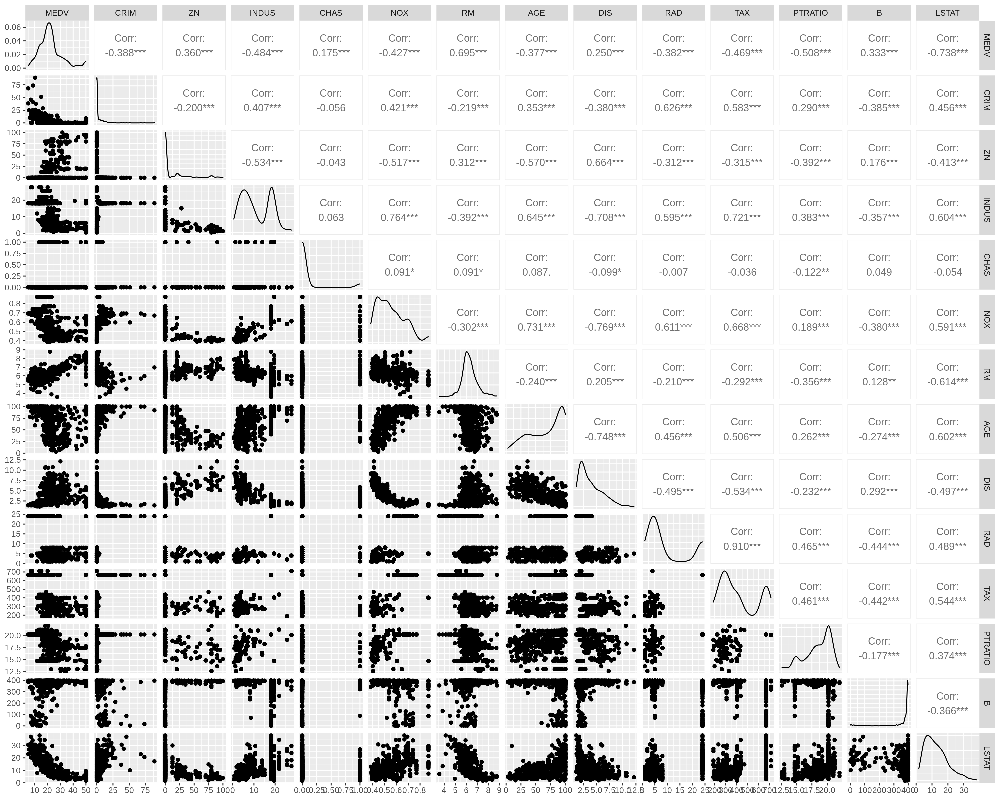

In [25]:
options(repr.plot.height=12)
ggpairs(boston_dataset)

 In the above ggpairs plot we can see the correlation, denisty curve and the scatterplot between pairs simultaenously.
 Below we will see more plot specifically focused on the correlation and density curves then derive inferences.  
  
**Inference:**
* Most of the variables are not normal.
 

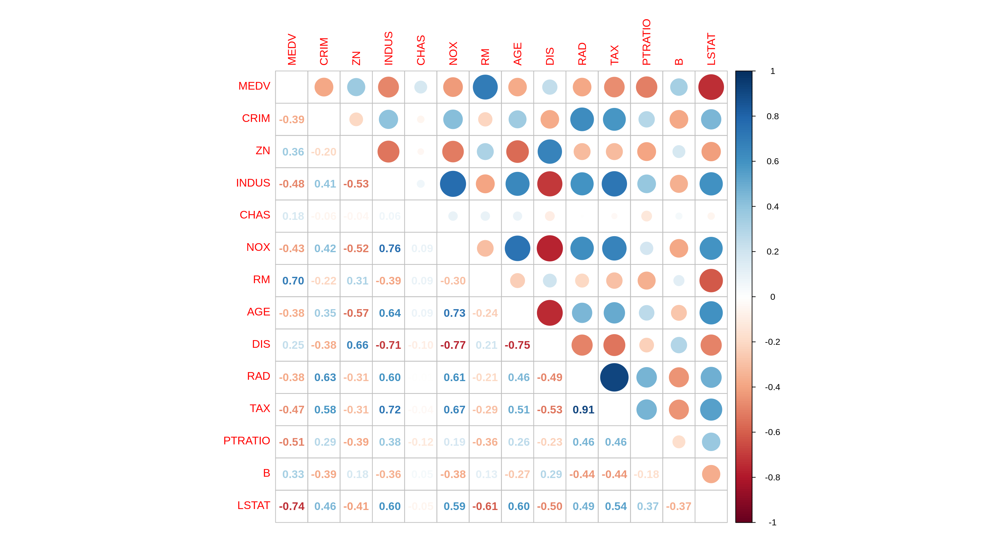

In [24]:
options(repr.plot.height=8)
corrplot.mixed(cor(boston_dataset), lower="number", upper="circle",tl.pos = "lt")

**Inference:** From the above data we can see the correlation between features. We can infer:
* (INDUS, NOX), (AGE, NOX), (TAX, INDUS), (TAX, RAD) and (MEDV, RM) paris are highly positively correlated.
* (DIS, INDUS), (DIS, NOX), (DIS, AGE) and (MEDV, LSTAT) pairs are highly negatively correlated.

Because MEDV is our target variable and we see two highly correlated features with it, we are interested in the jointdensity plot for them. They are given below:

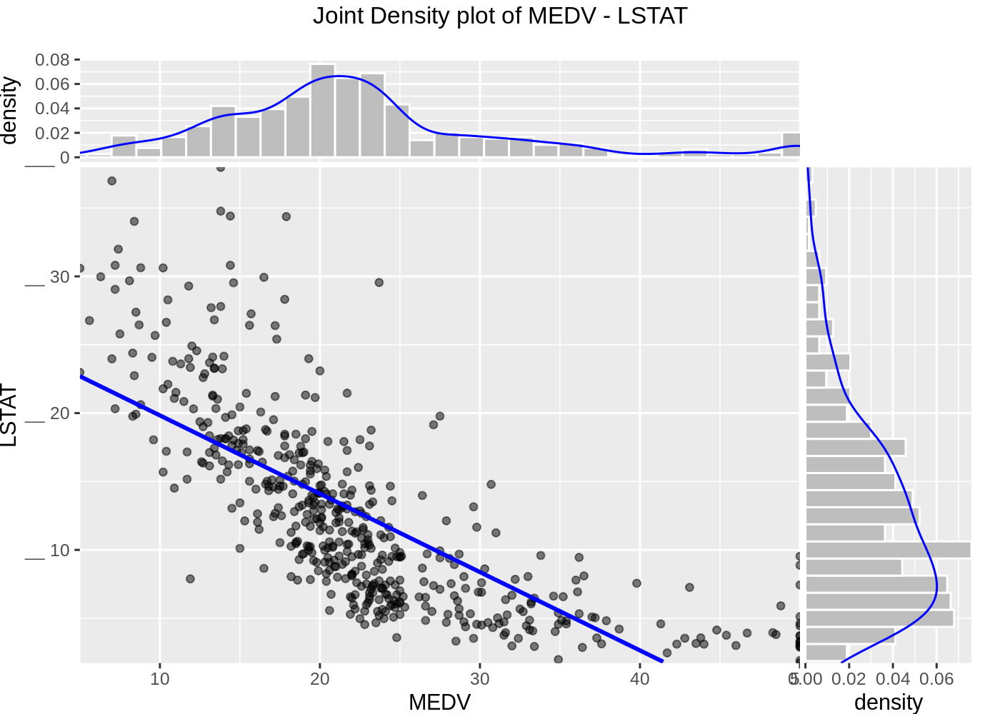

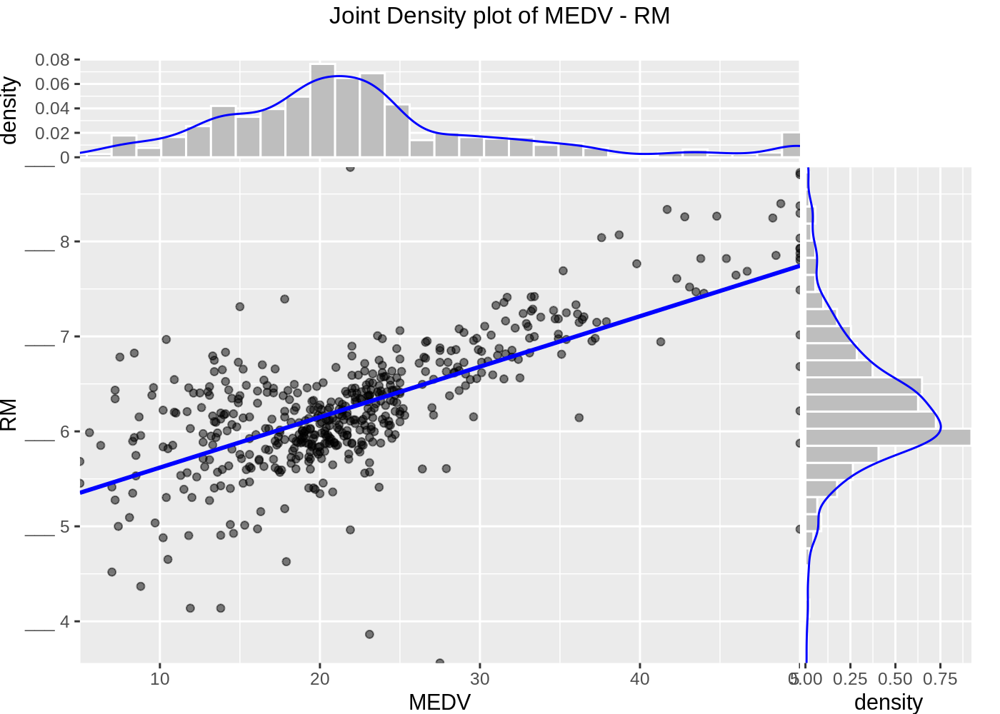

In [12]:
options(repr.plot.height=5, repr.plot.res=200)
# devtools::install_github("WinVector/WVPlots")
suppressMessages(library(WVPlots))
suppressWarnings( ScatterHist( boston_dataset, "MEDV", "LSTAT", title="Joint Density plot of MEDV - LSTAT"))
suppressWarnings( ScatterHist( boston_dataset, "MEDV", "RM", title="Joint Density plot of MEDV - RM"))

**Inference:**  
* MEDV is highly positively correlated with RM
* MEDV is highly negatively correlated with LSTAT.

### 3D Scatterplot for LSTAT, RM and MEDV:

In [8]:
library(rgl)
# Plot
plot3d( 
  x=boston_dataset$LSTAT, y=boston_dataset$RM, z=boston_dataset$MEDV, 
#   col = data$CHAS, 
  type = 's', 
  radius = .1,
  xlab="LSTAT", ylab="RM", zlab="MEDV")

# To display in an R Markdown document:
rglwidget()

# To save to a file:
 htmlwidgets::saveWidget(rglwidget(width = 800, height = 800), 
                        file = "3D-Scatterplot-MEDV-LSTAT-RM.html",
                        libdir = "libs",
                        selfcontained = FALSE
                        )

HTML widgets cannot be represented in plain text (need html)

**Inference:** 
* The points in the 3D scatterplot isnt lying on a plane.
* There isnt a proper linear relationship among LSTAT, RM and MEDV.

### Checking the outliers and density curve:

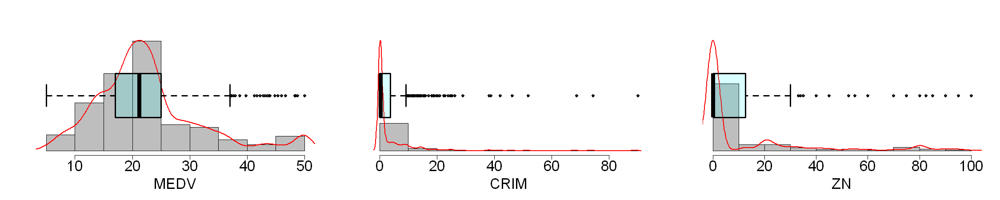

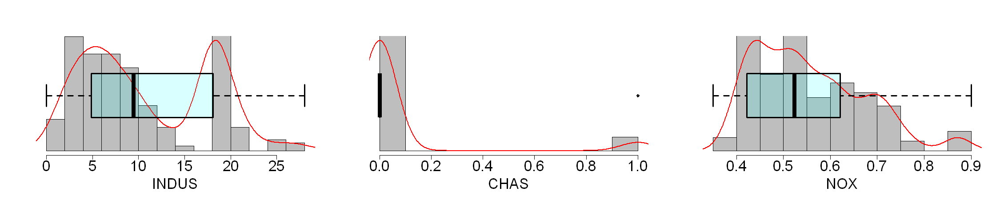

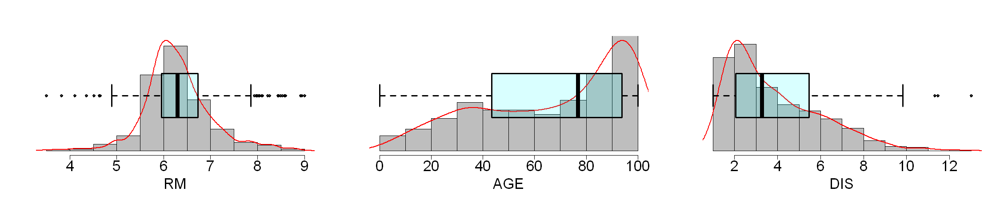

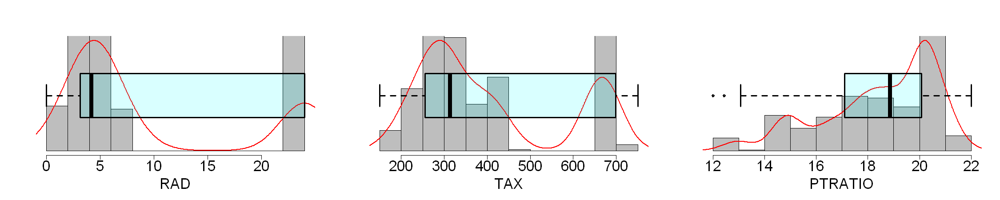

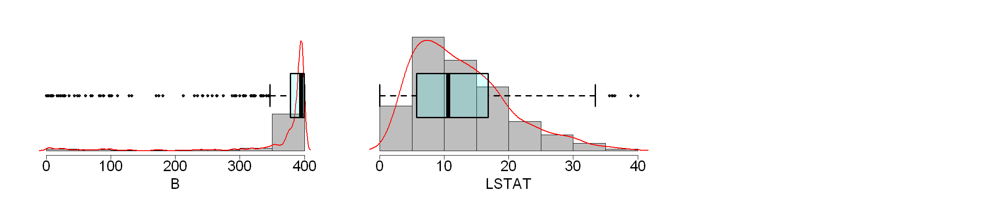

In [8]:
#setting the resolution of the plots
par(mfrow=c(1,3))
options(repr.plot.height=3,repr.plot.width=15, repr.plot.res=150)

# a function to plot density curve, histogram and boxplot of a feature simultaenously.
powerPlot <- function(x, name)
{
    dens <- density(x)
    # Histogram
    hist(x, probability = TRUE, xlab = name, ylab="", ylim= c(0, max(dens$y)), col = "grey",
        axes = FALSE, main = "", cex.lab=2)

    # Axis
    axis(1, cex.axis=2)

    # Density
    lines(dens, col = "red", lwd = 1.5)

    # Add boxplot
    par(new = TRUE)
    boxplot(x, horizontal = TRUE, axes = FALSE,
        lwd = 2, col = rgb(0, 1, 1, alpha = 0.15), outlier.colour="red")
}


# a loop to run powerPlot() for all of the features
for (x in names(boston_dataset)){
    powerPlot( boston_dataset[[x]], x)
}

**Inference:**
* None of the feature in perfect Normal distribution.
* We can see that CRIM, ZN, RM, B and MEDV have of outliers.
* Also we note that there isnt any specific one transformation that fits all features.

## Density Curve of Target Variable (MEDV - Price of the houses)

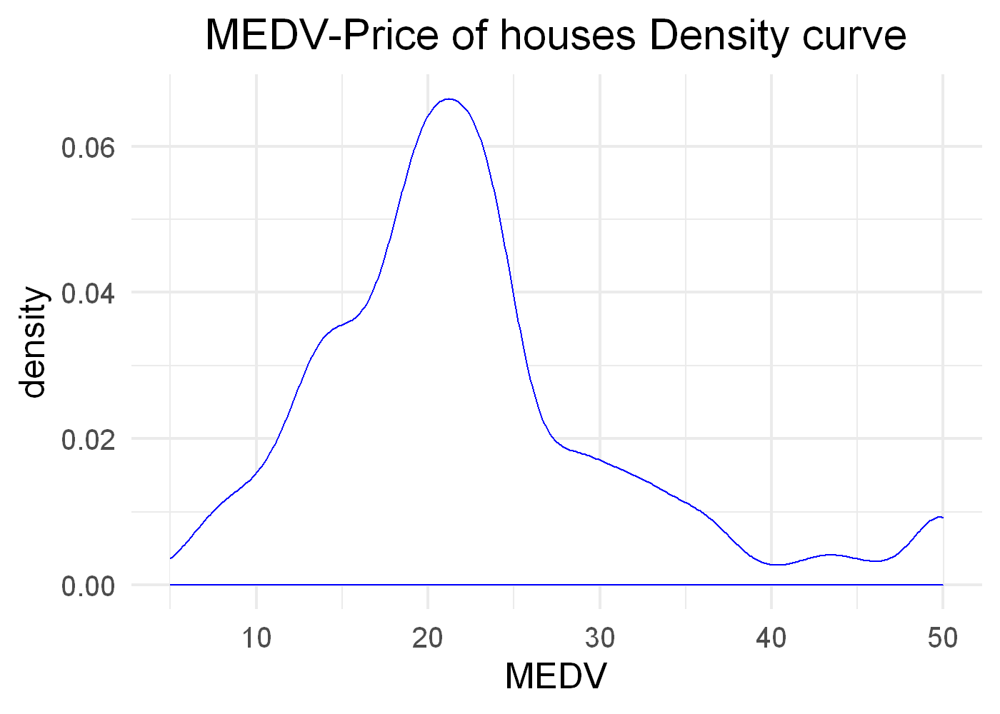

In [4]:
options(repr.plot.height=5, repr.plot.res=200)
boston_dataset %>% 
    ggplot(aes(MEDV)) +
    stat_density(fill="white", col="blue") +
    theme_minimal( base_size=18) +
    ggtitle("MEDV-Price of houses Density curve") + theme( plot.title = element_text( hjust=0.5))

**Inference:**
* The target variable is not normal.

### Relation of MEDV against other features:

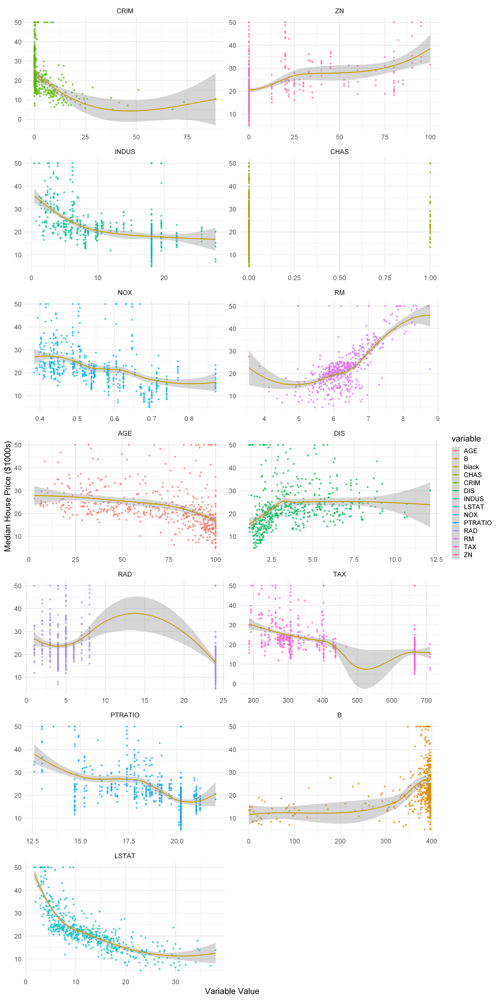

In [12]:
options(repr.plot.height=30, repr.plot.res=300)

rel <- boston_dataset %>%
    melt(id.vars = "MEDV") %>%
    ggplot(aes(x = value, y = MEDV, colour = variable), na.rm=TRUE) +
    geom_point(alpha = 0.7, na.rm=TRUE) +
    stat_smooth(aes(colour = "black"), na.rm=TRUE) +
    facet_wrap(~variable, scales = "free", ncol = 2) +
    labs(x = "Variable Value", y = "Median House Price ($1000s)") +
    theme_minimal( base_size=18) +
    theme( legend.text = element_text( size=14))

suppressMessages(suppressWarnings( print(rel)))

**Inference:** 
* There is no perfect linear relationship between MEDV and any other feature.
* Most of the relationship is non-linear.
* CHAS is a categorical feature, more concentrated on CHAS=0.


## Checking Outliers

In [33]:
count=0
outliers=c()
for(i in 1:nrow(boston_dataset)){
    x <- boston_dataset[i,]
    for(col in names(boston_dataset)){
        mu=mean(boston_dataset[[col]])
        sigma=sd(boston_dataset[[col]])
        if(x[[col]]<mu-3*sigma || x[[col]]>mu+3*sigma)
        {
            count=count+1
        }
    }
    if(count>0){
        outliers <- c(outliers, i)
    }
    count=0
}
cat("No. of Outliers:",length(outliers))

No. of Outliers: 91

# <center><b>MODELLING</b></center>

# Feature Engineering

### Backward Elimination

In [133]:
## backward elimination
BER=regsubsets(MEDV~.,data=boston_dataset,method="backward")
Modelsummary=cbind(summary(BER)$which,R2=summary(BER)$rsq,SSres=summary(BER)$rss,AdjR2=summary(BER)$adjr2,Cp=summary(BER)$cp,BIC=summary(BER)$bic)
Modelsummary
 

,(Intercept),CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,R2,SSres,AdjR2,Cp,BIC
1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0.5441463,19472.38,0.5432418,362.75295,-385.0521
2,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0.6385616,15439.31,0.6371245,185.64743,-496.2582
3,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0.6786242,13727.99,0.6767036,111.64889,-549.4767
4,1,0,0,0,0,0,1,0,1,0,0,1,0,1,0.6903077,13228.91,0.6878351,91.48526,-561.9884
5,1,0,0,0,0,1,1,0,1,0,0,1,0,1,0.7080893,12469.34,0.7051702,59.75364,-585.6823
6,1,0,0,0,0,1,1,0,1,0,0,1,1,1,0.7153894,12157.51,0.7119672,47.90533,-592.2707
7,1,0,0,0,0,1,1,0,1,1,0,1,1,1,0.7187396,12014.40,0.7147861,43.55007,-592.0357
8,1,1,0,0,0,1,1,0,1,1,0,1,1,1,0.7239766,11790.70,0.7195336,35.61547,-595.3196


**Significant Features** : CRIM , NOX , RM , DIS , RAD , PTRATIO , B , LSTAT

### Forward Substitution

In [35]:
## forward substituition
FSR=regsubsets(MEDV~.,data=boston_dataset,method="forward")
# summary(FSR)
Modelsummary=cbind(summary(FSR)$which,R2=summary(FSR)$rsq,SSres=summary(FSR)$rss,AdjR2=summary(FSR)$adjr2,Cp=summary(FSR)$cp,BIC=summary(FSR)$bic)
Modelsummary

,(Intercept),CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,R2,SSres,AdjR2,Cp,BIC
1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0.5441463,19472.38,0.5432418,362.75295,-385.0521
2,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0.6385616,15439.31,0.6371245,185.64743,-496.2582
3,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0.6786242,13727.99,0.6767036,111.64889,-549.4767
4,1,0,0,0,0,0,1,0,1,0,0,1,0,1,0.6903077,13228.91,0.6878351,91.48526,-561.9884
5,1,0,0,0,0,1,1,0,1,0,0,1,0,1,0.7080893,12469.34,0.7051702,59.75364,-585.6823
6,1,0,0,0,1,1,1,0,1,0,0,1,0,1,0.7157742,12141.07,0.7123567,47.17537,-592.9553
7,1,0,0,0,1,1,1,0,1,0,0,1,1,1,0.7221614,11868.24,0.7182560,37.05889,-598.2295
8,1,0,1,0,1,1,1,0,1,0,0,1,1,1,0.7266079,11678.30,0.7222072,30.62398,-600.1663


**Significant Features** : ZN , CHAS , NOX , RM , DIS , PTRATIO , B , LSTAT

### Stepwise Regression

In [36]:
#Stepwise Regression
SWR=regsubsets(MEDV~.,data=boston_dataset,method="seqrep")
Modelsummary=cbind(summary(SWR)$which,R2=summary(SWR)$rsq,SSres=summary(SWR)$rss,AdjR2=summary(SWR)$adjr2,Cp=summary(SWR)$cp,BIC=summary(SWR)$bic)
Modelsummary

,(Intercept),CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,R2,SSres,AdjR2,Cp,BIC
1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0.5441463,19472.38,0.5432418,362.75295,-385.0521
2,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0.6385616,15439.31,0.6371245,185.64743,-496.2582
3,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0.6786242,13727.99,0.6767036,111.64889,-549.4767
4,1,0,0,0,0,0,1,0,1,0,0,1,0,1,0.6903077,13228.91,0.6878351,91.48526,-561.9884
5,1,0,0,0,0,1,1,0,1,0,0,1,0,1,0.7080893,12469.34,0.7051702,59.75364,-585.6823
6,1,0,0,0,1,1,1,0,1,0,0,1,0,1,0.7157742,12141.07,0.7123567,47.17537,-592.9553
7,1,0,0,0,1,1,1,0,1,0,0,1,1,1,0.7221614,11868.24,0.7182560,37.05889,-598.2295
8,1,0,1,0,1,1,1,0,1,0,0,1,1,1,0.7266079,11678.30,0.7222072,30.62398,-600.1663


**Significant Features** : ZN , CHAS , NOX , RM , DIS , PTRATIO , B , LSTAT

## Model-1:
 
  We will create a model taking the intersection of features suggested by the above three methods.
  
  The glance of data of the suggested features is given below.

In [137]:
boston_dataset <- boston_dataset %>% dplyr::select(c(MEDV,ZN,CHAS,NOX,RM,DIS,PTRATIO,B,LSTAT))
head(boston_dataset)

MEDV,ZN,CHAS,NOX,RM,DIS,PTRATIO,B,LSTAT
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
24.0,18,0,0.538,6.575,4.0900,15.3,396.90,4.98
21.6,0,0,0.469,6.421,4.9671,17.8,396.90,9.14
34.7,0,0,0.469,7.185,4.9671,17.8,392.83,4.03
33.4,0,0,0.458,6.998,6.0622,18.7,394.63,2.94
36.2,0,0,0.458,7.147,6.0622,18.7,396.90,5.33
28.7,0,0,0.458,6.430,6.0622,18.7,394.12,5.21


### Modelling:

In [5]:
modelm <- lm(boston_dataset$MEDV ~ ., data =boston_dataset )
summary(modelm)

# RMSE for checking the accuracy of model
cat("RMSE:", sqrt(sum(modelm$residuals^2)/modelm$df))


Call:
lm(formula = boston_dataset$MEDV ~ ., data = boston_dataset)

Residuals:
     Min       1Q   Median       3Q      Max 
-15.6996  -2.7925  -0.5477   1.7005  27.6510 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  30.316950   4.870856   6.224 1.03e-09 ***
ZN            0.037808   0.013298   2.843 0.004652 ** 
CHAS          3.111062   0.870076   3.576 0.000384 ***
NOX         -16.687428   3.228873  -5.168 3.43e-07 ***
RM            4.116082   0.408594  10.074  < 2e-16 ***
DIS          -1.382714   0.187604  -7.370 7.15e-13 ***
PTRATIO      -0.881851   0.115718  -7.621 1.29e-13 ***
B             0.009404   0.002639   3.563 0.000401 ***
LSTAT        -0.543125   0.047652 -11.398  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 4.847 on 497 degrees of freedom
Multiple R-squared:  0.7266,	Adjusted R-squared:  0.7222 
F-statistic: 165.1 on 8 and 497 DF,  p-value: < 2.2e-16


RMSE: 4.847431

**<u>Model-1</u> <br>
    RMSE = 4.84
  <br> Adjusted R-Squared = 0.722**

# Adequecy Checking of Model-1

### Checking the multi-collinearity in model-1:

In [11]:
vif(modelm)

ZN     CHAS      NOX       RM      DIS  PTRATIO        B    LSTAT 
2.067289 1.049615 3.008635 1.771292 3.353885 1.348840 1.247488 2.488640

**Inference:**
* Since all values are well under 5, thus we can conclude that the features are **not multicollinear.**

### Residual Analysis

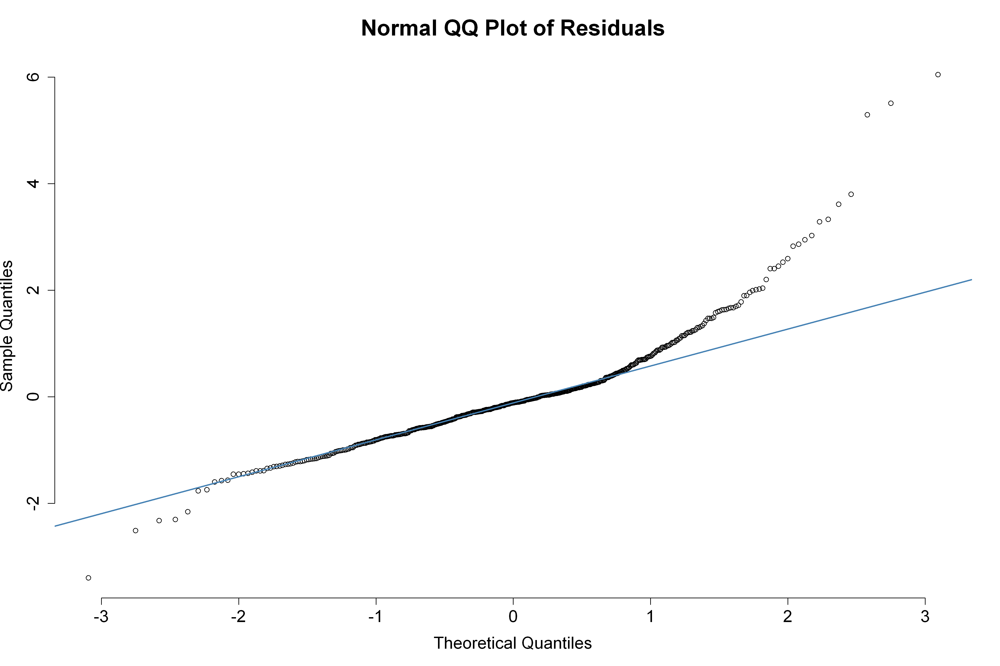

In [32]:
modelm <- lm(boston_dataset$MEDV ~ ., data =boston_dataset )
options(repr.plot.height=10, repr.plot.res=300)
res <- rstudent(modelm)

qqnorm(res, pch = 1, frame = FALSE, cex.lab=1.5, cex.axis=1.5, main="Normal QQ Plot of Residuals", cex.main=2)
qqline(res, col = "steelblue", lwd = 2)

**Inference:**
* Residuals are not normal
* Target variable is skewed, and requires transformation

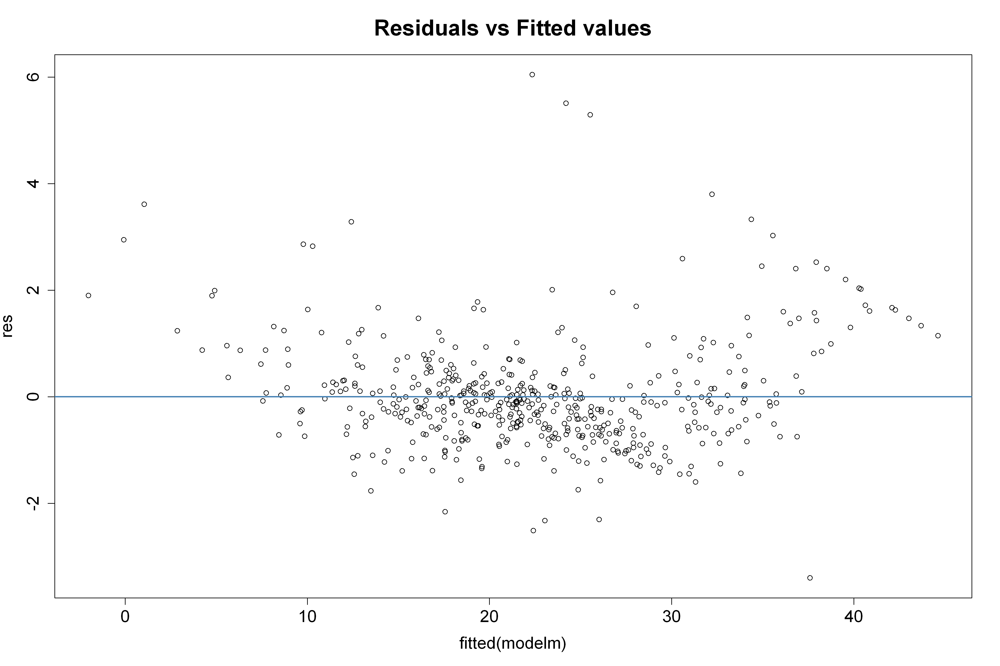

In [35]:
plot(fitted(modelm), res, cex.lab=1.5,cex.axis=1.5, main="Residuals vs Fitted values", , cex.main=2)
abline(0,0,col = "steelblue", lwd = 2)

**Inference:**  
* A faint Double bow shaped can be observed
* Either Regressor or/and Regressand requires transformation

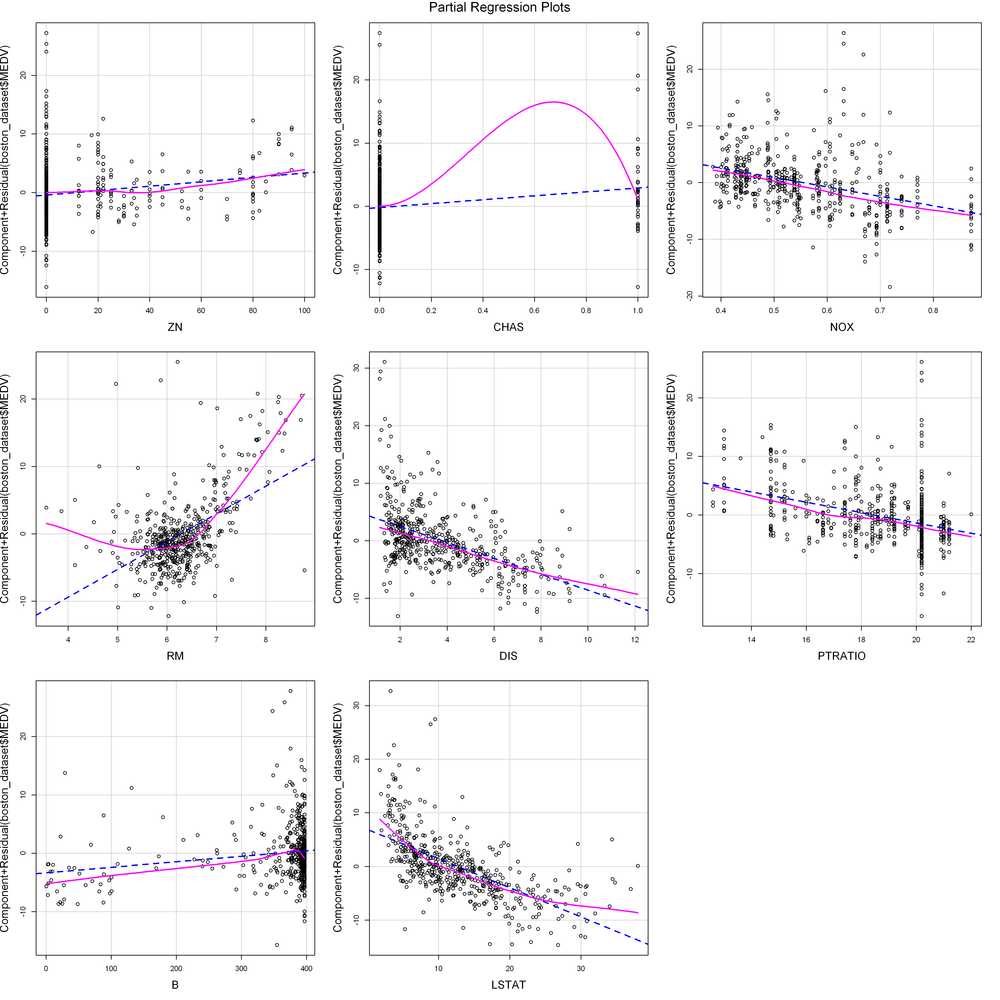

In [46]:
par(mfrow=c(1,2))
options(repr.plot.height=15, repr.plot.res=300)

crPlots(modelm,main="Partial Regression Plots", cex.main=2, cex.lab=1.5)

**Inference:**  
* `LSTAT` and `RM` shows Non-linear relationship with target variable

### Influential Points (Model-1)

In [8]:
## Checking for Influence Points 

inflm.boston <-  influence.measures(modelm)
inf_pts<-which(apply(inflm.boston$is.inf, 1, any))
# which observations 'are' influential

dim(summary(inflm.boston)) # only these

Potentially influential observations of
	 lm(formula = boston_dataset$MEDV ~ ., data = boston_dataset) :

    dfb.1_ dfb.ZN dfb.CHAS dfb.NOX dfb.RM  dfb.DIS dfb.PTRA dfb.B dfb.LSTA
143  0.01   0.00  -0.07    -0.04    0.01   -0.02    0.04    -0.03 -0.03   
145  0.01   0.00  -0.02     0.06   -0.03    0.03   -0.07     0.04  0.03   
146  0.00  -0.01  -0.01     0.02    0.01    0.02   -0.03    -0.01  0.02   
147 -0.01   0.00   0.01    -0.02    0.01   -0.01    0.02     0.01  0.01   
150  0.00   0.00   0.00     0.00    0.00    0.00    0.00     0.00  0.00   
151  0.00   0.00   0.00     0.00    0.00    0.00    0.00     0.00  0.00   
152  0.01   0.00  -0.01     0.02   -0.01    0.01   -0.01     0.00 -0.01   
153 -0.07  -0.01  -0.18    -0.17    0.17   -0.05    0.09     0.00  0.14   
154  0.01   0.00  -0.01     0.04   -0.02    0.02   -0.03    -0.01 -0.02   
155  0.02   0.02  -0.20    -0.19    0.03   -0.10    0.09     0.00  0.04   
156 -0.04   0.03  -0.20    -0.14    0.05   -0.09    0.10     0.16  0.

[1] 54 13

**Inference:** 
* There are 54 potentially influental points in our data. 

Since this can affect our model adversely we check which influence points lies outside 2-sigma limits and remove those points.

#### Influence points that are outliers:

In [41]:
#boston_dataset<-boston_dataset[-inf_pts,]

count=0
outliers=c()
for(i in inf_pts){
    x <- boston_dataset[i,]
    for(col in names(boston_dataset)){
        mu=mean(boston_dataset[[col]])
        sigma=sd(boston_dataset[[col]])
        if(x[[col]]<mu-2*sigma || x[[col]]>mu+2*sigma)
        {
            count=count+1
        }
    }
    if(count>0){
        outliers <- c(outliers, i)
    }
    count=0
}
length(outliers)

[1] 51

**Inference:**
* 51 out of 54 influence points lie outside 2-sigma limits.

Removing all 54 points resulted in better model.

## Transformations

#### Transformation on Regressors

After Transformation of LSTAT and DIS:

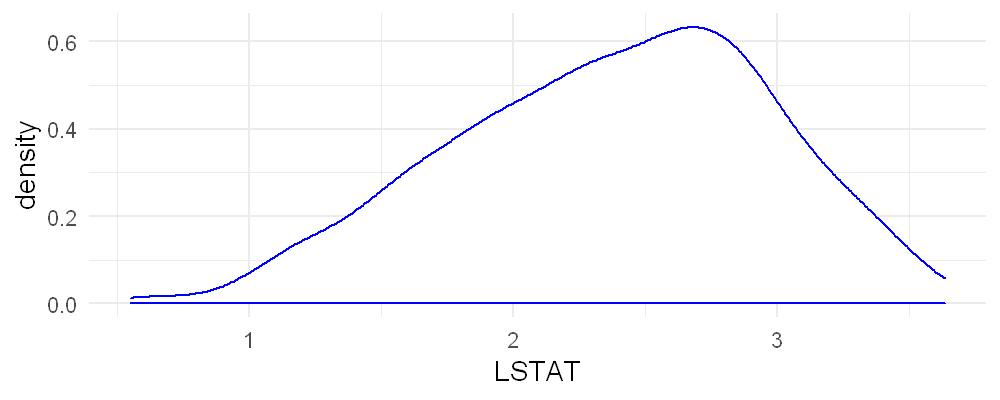

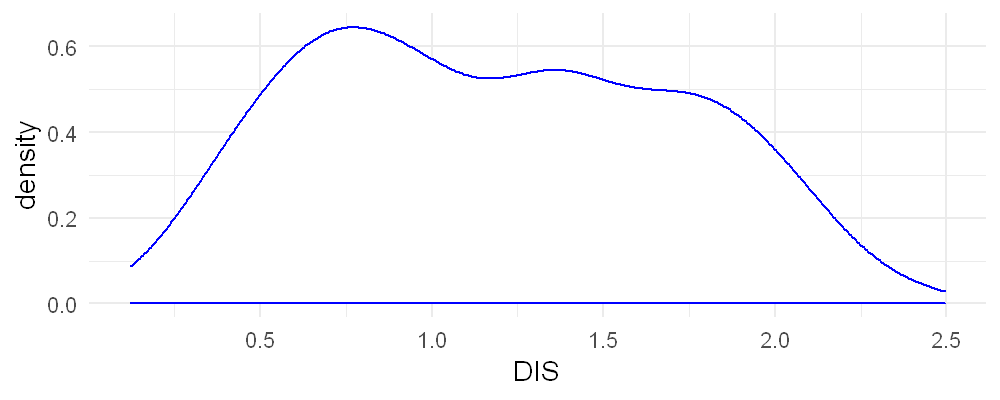

In [156]:
boston_dataset_transformed<-transform(boston_dataset, LSTAT=log(LSTAT), DIS=log(DIS))
options(repr.plot.height=2, repr.plot.res=200)
par(mfrow=c(1,2))
cat("After Transformation of LSTAT and DIS:")
boston_dataset_transformed %>% 
    ggplot(aes(LSTAT)) +
    stat_density(fill="white", col="blue") +
    theme_minimal( base_size=10)
boston_dataset_transformed %>% 
    ggplot(aes(DIS)) +
    stat_density(fill="white", col="blue") +
    theme_minimal( base_size=10) 

#### Box-Cox Transformation

Lambda Max :  0.4242424

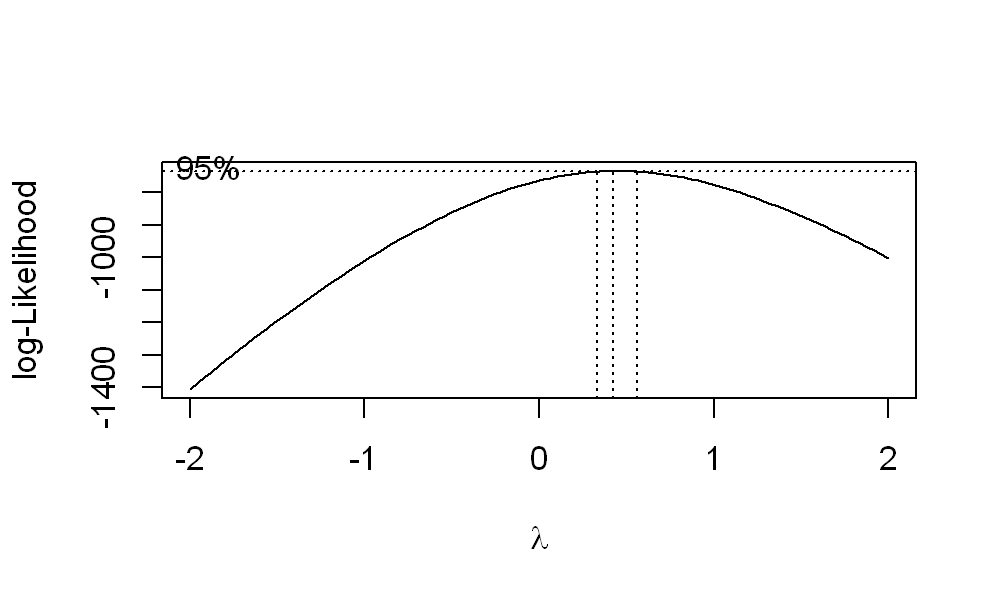

In [157]:
options(repr.plot.height=3,repr.plot.width=5, repr.plot.res=200)
bc <- boxcox(MEDV ~ ., data=boston_dataset_transformed)
cat('Lambda Max : ', bc$x[which.max(bc$y)])
lambda<-bc$x[which.max(bc$y)]

#### Modelling on Transformed Data:

Adjusted R square :


Call:
lm(formula = ((MEDV^lambda - 1)/lambda) ~ ., data = boston_dataset_transformed)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.6443 -0.3623 -0.0175  0.3733  3.3044 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) 11.5315961  0.7685574  15.004  < 2e-16 ***
CHAS         0.4445992  0.1244068   3.574 0.000386 ***
NOX         -3.0216454  0.5158827  -5.857 8.56e-09 ***
RM           0.3919066  0.0602949   6.500 1.96e-10 ***
DIS         -0.7270130  0.1047733  -6.939 1.23e-11 ***
PTRATIO     -0.1300737  0.0160451  -8.107 4.06e-15 ***
B            0.0018293  0.0003744   4.886 1.39e-06 ***
LSTAT       -1.4454657  0.0853161 -16.942  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.6932 on 498 degrees of freedom
Multiple R-squared:  0.7836,	Adjusted R-squared:  0.7805 
F-statistic: 257.6 on 7 and 498 DF,  p-value: < 2.2e-16


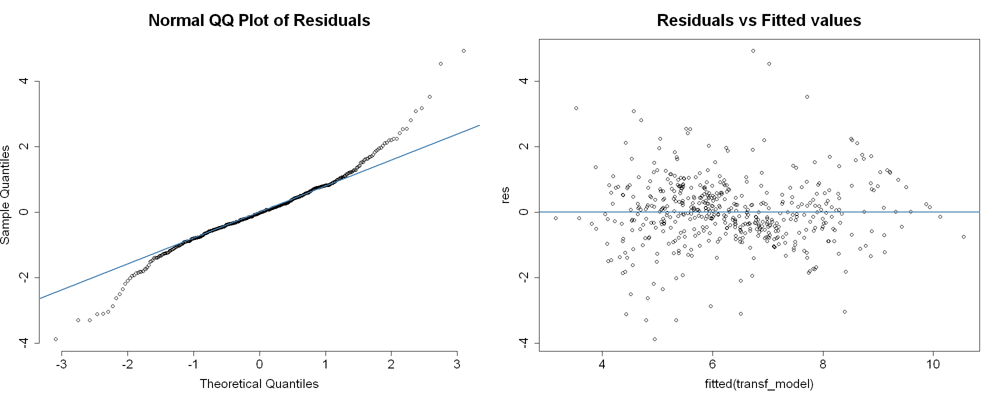

In [162]:
options(repr.plot.height=8,repr.plot.width=20, repr.plot.res=100)

boston_dataset_transformed = subset(boston_dataset_transformed, select = -c(ZN) )
transf_model<- lm(((MEDV^lambda-1)/lambda) ~ ., data=boston_dataset_transformed)

cat("Adjusted R square :")
summary(transf_model)

par(mfrow=c(1,2))
res <- rstudent(transf_model)
qqnorm(res, pch = 1, frame = FALSE, cex.lab=1.5, cex.axis=1.5, main="Normal QQ Plot of Residuals", cex.main=2)
qqline(res, col = "steelblue", lwd = 2)

plot(fitted(transf_model), res, cex.lab=1.5,cex.axis=1.5, main="Residuals vs Fitted values", , cex.main=2)
abline(0,0,col = "steelblue", lwd = 2)



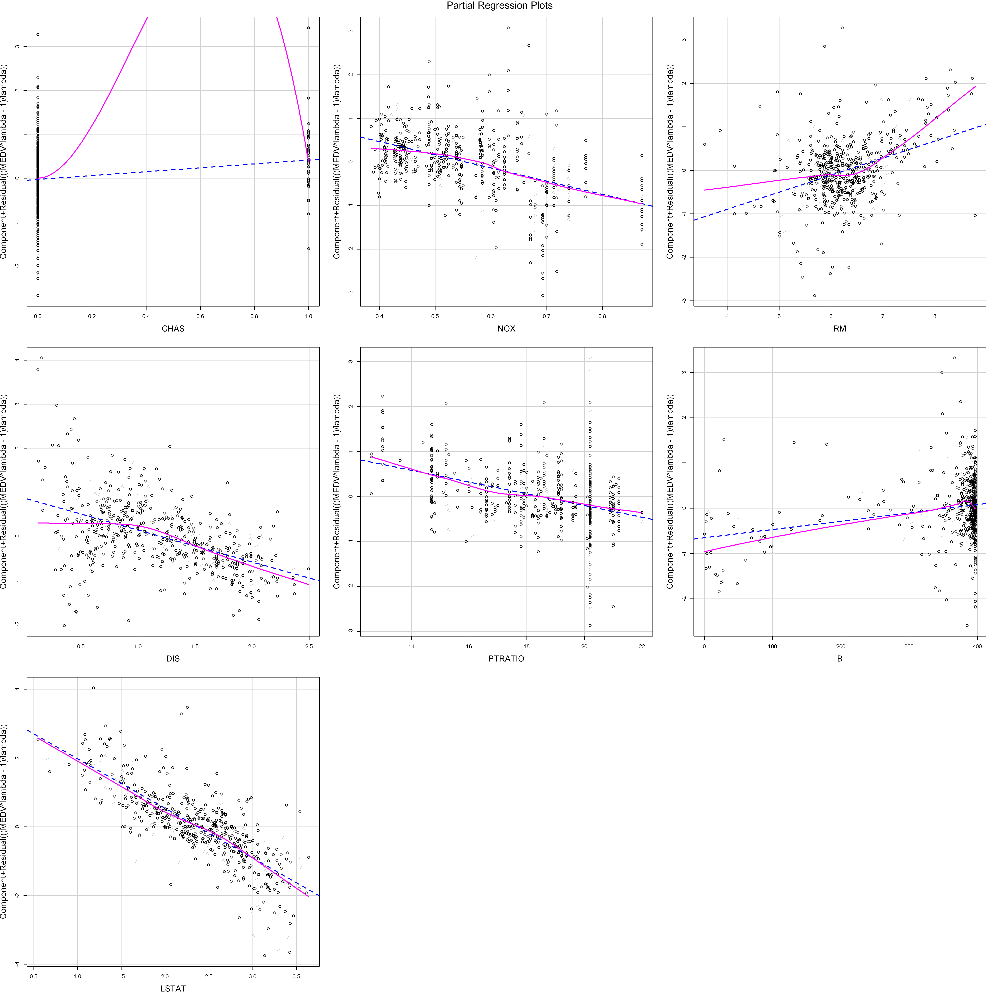

In [168]:
par(mfrow=c(1,2))
options(repr.plot.height=20, repr.plot.res=300)

crPlots(transf_model,main="Partial Regression Plots", cex.main=5, cex.lab=1.5)

**Inference:**  
* The New Target Variable is a light tailed normal distribution

In [171]:
## Checking for Influence Points 

inflm.boston <-  influence.measures(transf_model)
inf_pts<-which(apply(inflm.boston$is.inf, 1, any))
# which observations 'are' influential

dim(summary(inflm.boston)) # only these
#boston_dataset<-boston_dataset[-inf_pts,]

count=0
outliers=c()
for(i in inf_pts){
    x <- boston_dataset_transformed[i,]
    for(col in names(boston_dataset_transformed)){
        mu=mean(boston_dataset_transformed[[col]])
        sigma=sd(boston_dataset_transformed[[col]])
        if(x[[col]]<mu-2*sigma || x[[col]]>mu+2*sigma)
        {
            count=count+1
        }
    }
    if(count>0){
        outliers <- c(outliers, i)
    }
    count=0
}
length(outliers)

# removing outlier-influence-points
boston_dataset_transformed<-boston_dataset[-inf_pts,]
dim(boston_dataset_transformed)

Potentially influential observations of
	 lm(formula = ((MEDV^lambda - 1)/lambda) ~ ., data = boston_dataset_transformed) :

    dfb.1_ dfb.CHAS dfb.NOX dfb.RM dfb.DIS dfb.PTRA dfb.B dfb.LSTA dffit  
8   -0.08  -0.02     0.05    0.08   0.17   -0.20     0.06  0.24     0.36  
103  0.00   0.00     0.00    0.00   0.00    0.00    -0.01  0.00     0.01  
143  0.00  -0.13    -0.08    0.03  -0.03    0.08    -0.05 -0.03    -0.21  
144  0.00  -0.02     0.05   -0.01   0.02   -0.05     0.03  0.01     0.09  
145 -0.01   0.01    -0.03    0.02  -0.01    0.03    -0.02  0.00    -0.05  
146  0.00  -0.01     0.02    0.01   0.01   -0.03    -0.01  0.01     0.05  
147  0.00   0.00     0.01   -0.01   0.00   -0.01    -0.01  0.00     0.02  
148  0.01  -0.03     0.08   -0.05   0.03   -0.09     0.05  0.01     0.16  
150  0.00   0.00     0.01    0.00   0.01   -0.01     0.00  0.00     0.02  
152  0.02  -0.02     0.06   -0.04   0.02   -0.04     0.01 -0.03     0.10  
153 -0.08  -0.20    -0.18    0.18  -0.08    0.10  

[1] 66 12

[1] 51

[1] 455   9

### Modelling after removing the influental points - Model-1.2:

In [172]:
names(boston_dataset_transformed)
modelm <- lm(((MEDV^lambda-1)/lambda) ~ ., data =boston_dataset_transformed )
summary(modelm)

cat("RMSE:", sqrt(sum(modelm$residuals^2)/modelm$df))


[1] "MEDV"    "ZN"      "CHAS"    "NOX"     "RM"      "DIS"     "PTRATIO"
[8] "B"       "LSTAT"


Call:
lm(formula = ((MEDV^lambda - 1)/lambda) ~ ., data = boston_dataset_transformed)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.34148 -0.35040 -0.03812  0.34995  2.36296 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  6.4303276  0.7323593   8.780  < 2e-16 ***
ZN           0.0006488  0.0017903   0.362    0.717    
CHAS         0.2188036  0.2280671   0.959    0.338    
NOX         -2.8948947  0.5334164  -5.427 9.42e-08 ***
RM           0.7543251  0.0653388  11.545  < 2e-16 ***
DIS         -0.1217552  0.0263930  -4.613 5.19e-06 ***
PTRATIO     -0.1505945  0.0171851  -8.763  < 2e-16 ***
B            0.0024387  0.0004174   5.843 9.91e-09 ***
LSTAT       -0.0776420  0.0074270 -10.454  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.6346 on 446 degrees of freedom
Multiple R-squared:  0.8022,	Adjusted R-squared:  0.7987 
F-statistic: 226.1 on 8 and 446 DF,  p-value: < 2.2e-16


RMSE: 0.6345995

**<u>Model-1.2</u><br>
RMSE = 3.59<br>
Adjusted R-Squared = 0.81**

Thus we got considerable improvement in RMSE from 4.84 to 3.59.


### Multicollinearity Check

In [15]:
vif(modelm)

ZN     CHAS      NOX       RM      DIS  PTRATIO        B    LSTAT 
2.084467 1.060785 3.686665 2.060483 3.488450 1.505561 1.271683 3.192705

**Inference:** There is no multicollinearity.

### Normality Check

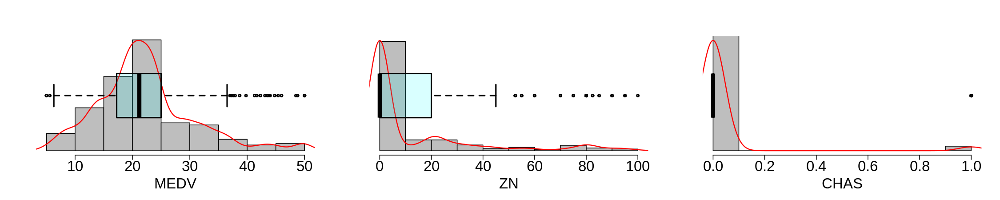

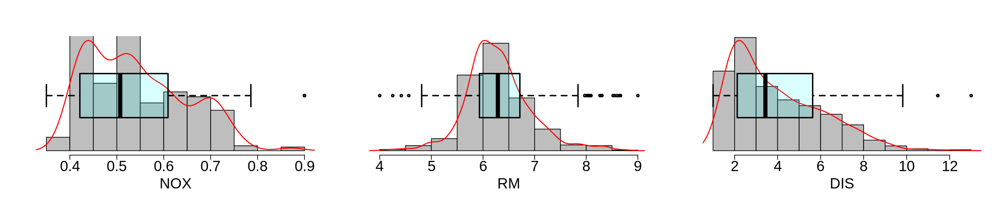

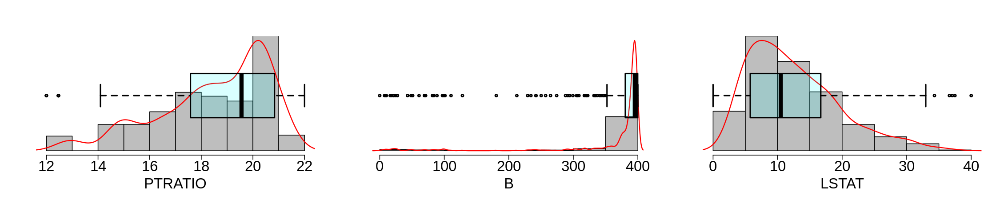

In [21]:
par(mfrow=c(1,3))
options(repr.plot.height=3,repr.plot.width=15, repr.plot.res=150)
powerPlot <- function(x, name) {

dens <- density(x)
# Histogram
hist(x, probability = TRUE, xlab = name, ylab="", ylim= c(0, max(dens$y)), col = "grey",
     axes = FALSE, main = "", cex.lab=2)

# Axis
axis(1, cex.axis=2)

# Density
lines(dens, col = "red", lwd = 1.5)

# Add boxplot
par(new = TRUE)
boxplot(x, horizontal = TRUE, axes = FALSE,
        lwd = 2, col = rgb(0, 1, 1, alpha = 0.15), outlier.colour="red")
}


# a loop to run powerPlot() for all of the features
for (x in names(boston_dataset)){
    powerPlot( boston_dataset[[x]], x)
}

**Inference:**
* The data are not perfectly normal.

### Checking Normality of Residuals (Model-1.2):
1. QQ Plot
2. Shapiro Test
3. Anderson-Darling Test

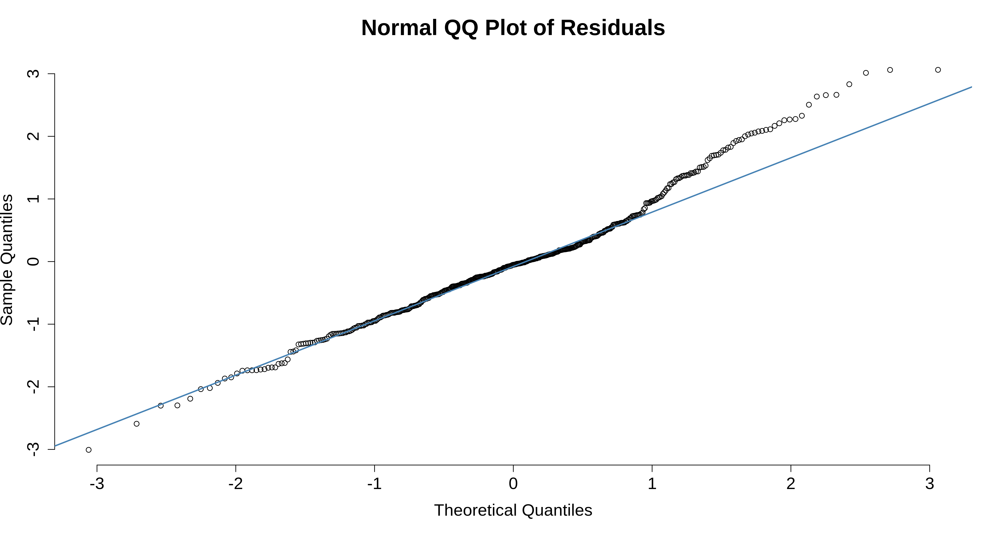

In [22]:
# Test-1. QQ Plot
options(repr.plot.height=8, repr.plot.res=300)
ors <- rstandard(modelm)

qqnorm(ors, pch = 1, frame = FALSE, cex.lab=1.5, cex.axis=1.5, main="Normal QQ Plot of Residuals", cex.main=2)
qqline(ors, col = "steelblue", lwd = 2)

In [50]:
# Test-2
shapiro.test(rstandard(modelm))


	Shapiro-Wilk normality test

data:  rstandard(modelm)
W = 0.9806, p-value = 9.724e-06


In [51]:
# Test-3: Anerson Darling Test
ad.test(rstandard(modelm))


	Anderson-Darling normality test

data:  rstandard(modelm)
A = 3.1431, p-value = 6.853e-08


**Inference:** From the above tests we can infer following:
* The residuals are not normal.

We estimate this result due to the fact that the target variable in the data wasnt distributed normally.

### Linear Relation between Residuals and Xs

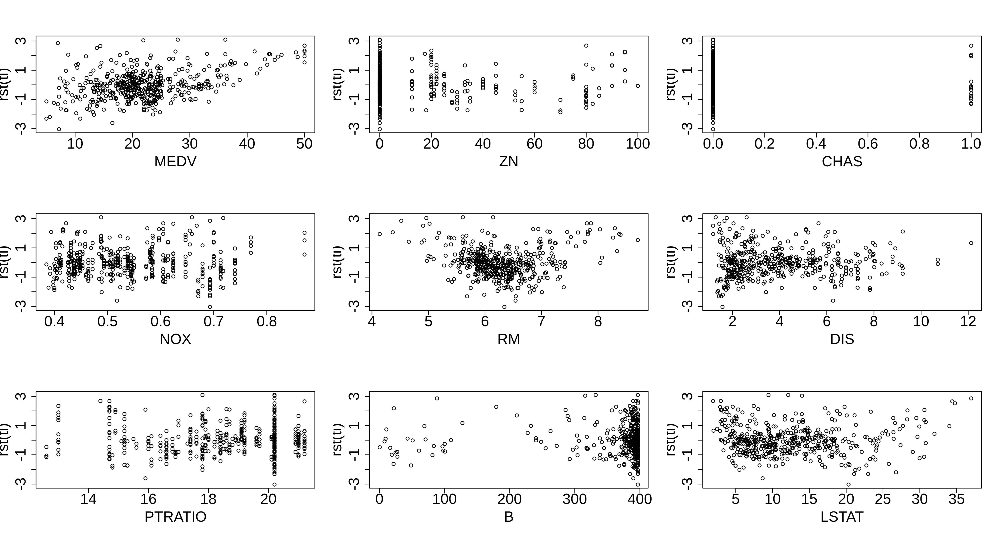

In [52]:
## linear relation between residuals and X's
par(mfrow=c(3,3))
for (x in names(boston_dataset)){
    plot(boston_dataset[[x]],rstudent(modelm),xlab = x,ylab = "rst(ti)", cex.lab=2, cex.axis=2)}


**Inference:**
* The X values are not linearly related to Y.

# Principal Component Regression Analysis

In [23]:
# GETTING Principal Components
boston_x <- boston_dataset[,c(-1)]

#Scale the data
res.pca <- prcomp(boston_x, retx=TRUE,center = FALSE, scale = TRUE)


## Summary of PCAs:

In [24]:
summary(res.pca)

Importance of components:
                          PC1    PC2    PC3    PC4     PC5     PC6     PC7
Standard deviation     2.3972 0.9854 0.9790 0.4391 0.28491 0.18589 0.09541
Proportion of Variance 0.7183 0.1214 0.1198 0.0241 0.01015 0.00432 0.00114
Cumulative Proportion  0.7183 0.8397 0.9595 0.9836 0.99375 0.99807 0.99920
                           PC8
Standard deviation     0.07975
Proportion of Variance 0.00080
Cumulative Proportion  1.00000

Eigen values or equivalently variance of Principal Components:
(The same information is available in the above summary)

In [25]:
eigval<- get_eigenvalue(res.pca)
eigval

,eigenvalue,variance.percent,cumulative.variance.percent
,<dbl>,<dbl>,<dbl>
Dim.1,5.746706765,71.83383456,71.83383
Dim.2,0.970951972,12.13689965,83.97073
Dim.3,0.958351714,11.97939643,95.95013
Dim.4,0.192799964,2.40999955,98.36013
Dim.5,0.081171090,1.01463863,99.37477
Dim.6,0.034555535,0.43194419,99.80671
Dim.7,0.009102454,0.11378067,99.92049
Dim.8,0.006360505,0.07950631,100.00000


## Scree Plot

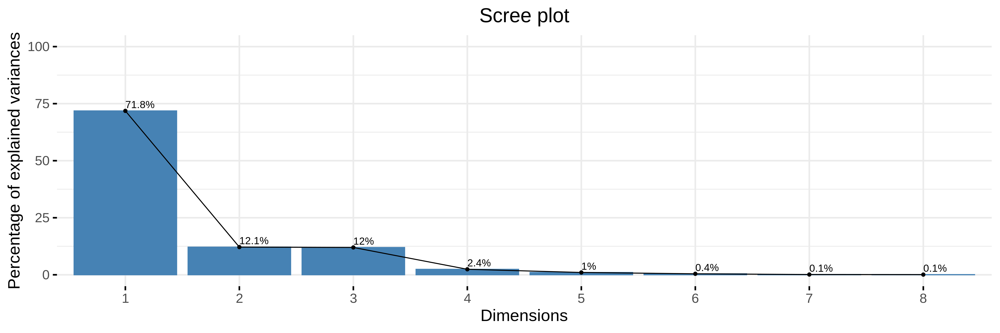

In [26]:
options( repr.plot.height=5)
fviz_eig(res.pca, addlabels = TRUE, ylim = c(0,100), ggtheme = theme_minimal(base_size=18)+ theme( plot.title = element_text( hjust=0.5)))

**Inference:**
* PC-1 explains the most proportion of variance.
* The elbow occurs at PC-2.

Below we will look further into PC-1 and PC-2.

### Checking contributions of variables to Principal Components

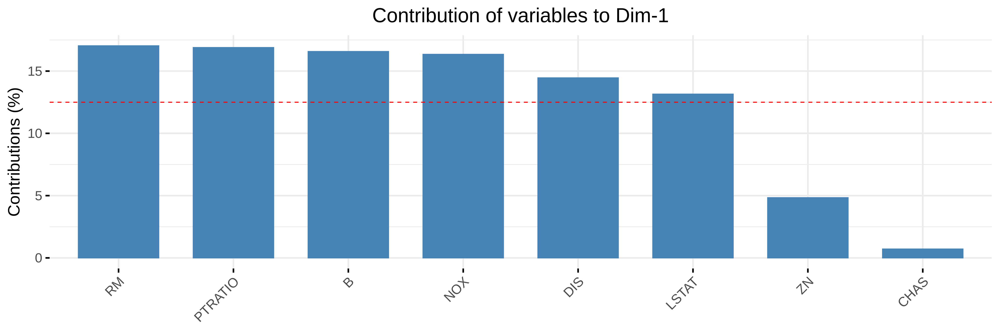

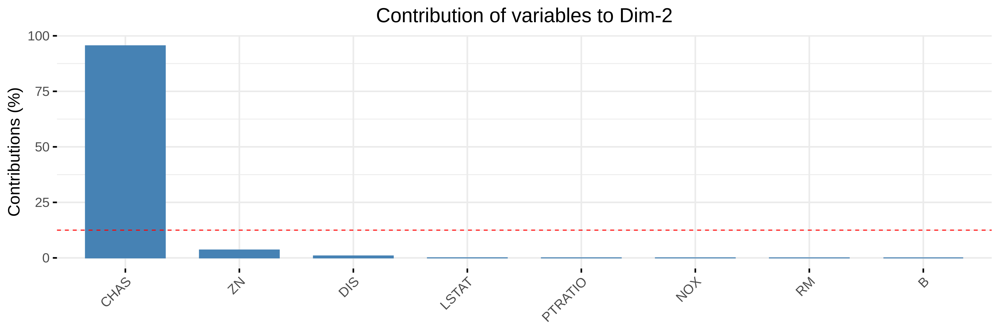

In [27]:
library(factoextra)

options(repr.plot.height=5, repr.plot.res=300)

# Contributions of variables to PCs

fviz_contrib(res.pca, choice = "var", axes = 1, top = 10, ggtheme = theme_minimal(base_size=18)+ theme( plot.title = element_text( hjust=0.5)))
fviz_contrib(res.pca, choice = "var", axes = 2, top = 10, ggtheme = theme_minimal(base_size=18)+ theme( plot.title = element_text( hjust=0.5)))

**Inference:**
* PC-1 is contributed largely by multiple variables.
* PC-2 is largely contributed mostly by CHAS.

The below chart shows the same thing.

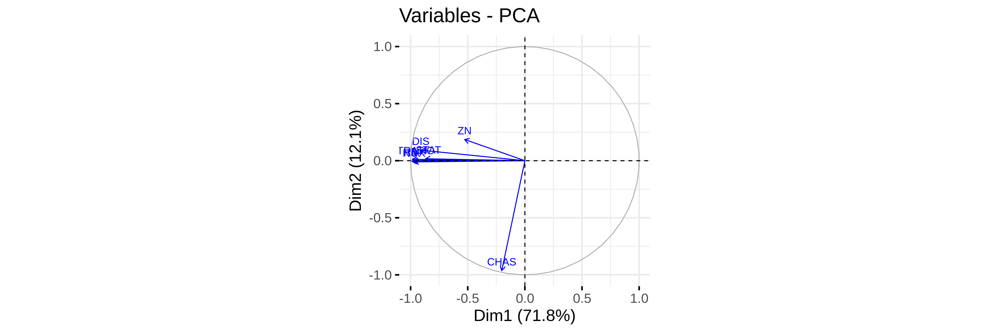

In [140]:
fviz_pca_var(res.pca, col.var = "blue", ggtheme = theme_minimal(base_size=18))

## Model with PCA1 suggested features data: Model-2

In [19]:
##model with PCA1 suggested features data.

model_pca2 = lm(MEDV~RM+PTRATIO+DIS+LSTAT,data=boston_dataset)
summary(model_pca2)

cat("Adjusted R squared:",summary(model_pca2)$adj.r.squared,"\n")
cat("RMSE:", sqrt(sum(model_pca2$residuals^2)/model_pca2$df))


Call:
lm(formula = MEDV ~ RM + PTRATIO + DIS + LSTAT, data = boston_dataset)

Residuals:
     Min       1Q   Median       3Q      Max 
-11.0506  -2.4811  -0.1807   2.0397  12.8470 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 19.29930    3.74631   5.152 3.88e-07 ***
RM           5.04184    0.39038  12.915  < 2e-16 ***
PTRATIO     -1.11330    0.09904 -11.241  < 2e-16 ***
DIS         -0.36098    0.10625  -3.397 0.000741 ***
LSTAT       -0.55012    0.04024 -13.671  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.842 on 447 degrees of freedom
Multiple R-squared:  0.792,	Adjusted R-squared:  0.7901 
F-statistic: 425.4 on 4 and 447 DF,  p-value: < 2.2e-16


Adjusted R squared: 0.7900978 
RMSE: 3.841527

**<u>Model-2</u>
<br>RMSE = 3.84
<br> Adjusted R-squared = 0.79**

# lm() Model

 The lm() model is built based upon the suggested features of all of the previous methods. The influental outliers also have been removed in previous section.

### Modelling:

In [18]:
lm_model = lm(MEDV~., data=boston_dataset)

summary(lm_model)

cat("Adjusted R squared:",summary(lm_model)$adj.r.squared,"\n")
cat("RMSE:", sqrt(sum(lm_model$residuals^2)/lm_model$df))


Call:
lm(formula = MEDV ~ ., data = boston_dataset)

Residuals:
     Min       1Q   Median       3Q      Max 
-10.7257  -2.3428  -0.1833   1.8036  10.9265 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  16.020270   4.249095   3.770 0.000185 ***
ZN            0.024037   0.010321   2.329 0.020306 *  
CHAS          1.644239   0.971178   1.693 0.091152 .  
NOX         -13.474252   3.114537  -4.326 1.88e-05 ***
RM            5.500903   0.385304  14.277  < 2e-16 ***
DIS          -0.924084   0.152473  -6.061 2.90e-09 ***
PTRATIO      -0.957900   0.097860  -9.789  < 2e-16 ***
B             0.013213   0.002318   5.701 2.18e-08 ***
LSTAT        -0.398100   0.043608  -9.129  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.591 on 443 degrees of freedom
Multiple R-squared:  0.8198,	Adjusted R-squared:  0.8166 
F-statistic:   252 on 8 and 443 DF,  p-value: < 2.2e-16


Adjusted R squared: 0.8165939 
RMSE: 3.590891

**<u>FInal Model</u>
<br>RMSE = 3.59
<br>Adjusted R-Squared = 0.81**

 Above is the best value we got for RMSE and Adjusted R-squared among all of our models.

### Predicting using the model:

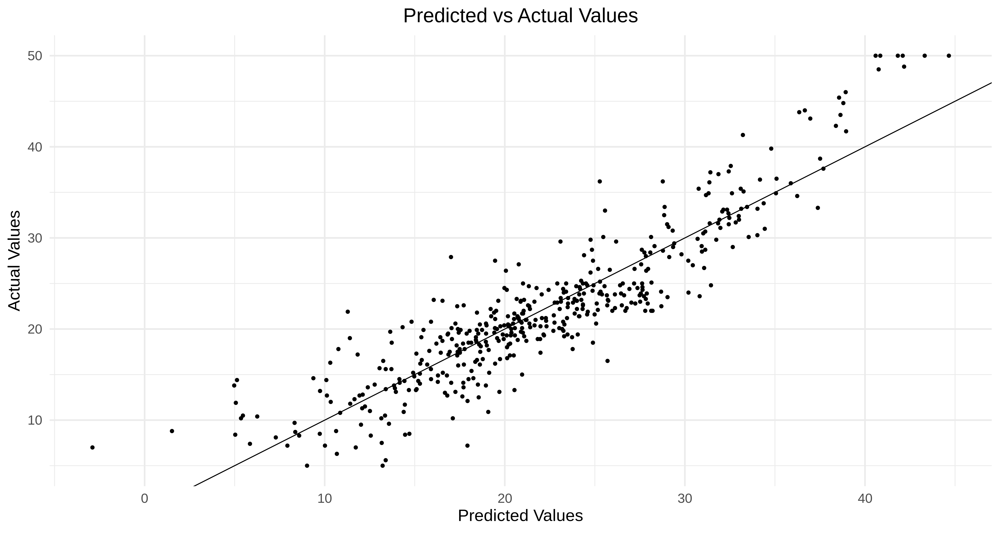

In [28]:
options( repr.plot.height=8)

pred<- predict(lm_model, boston_dataset)
act_vs_pred<- data.frame(actual= boston_dataset$MEDV, predicted= pred)

ggplot(act_vs_pred, aes(x= predicted, y=actual))+
geom_point()+
geom_abline(intercept=0, slope=1)+
theme_minimal(base_size=18) + theme( plot.title = element_text( hjust=0.5)) +
labs(x= 'Predicted Values', y= "Actual Values", title= "Predicted vs Actual Values")


**Inference:**
* There is the linearity between predicted values and the observed values.

### Checking the normality of residuals:

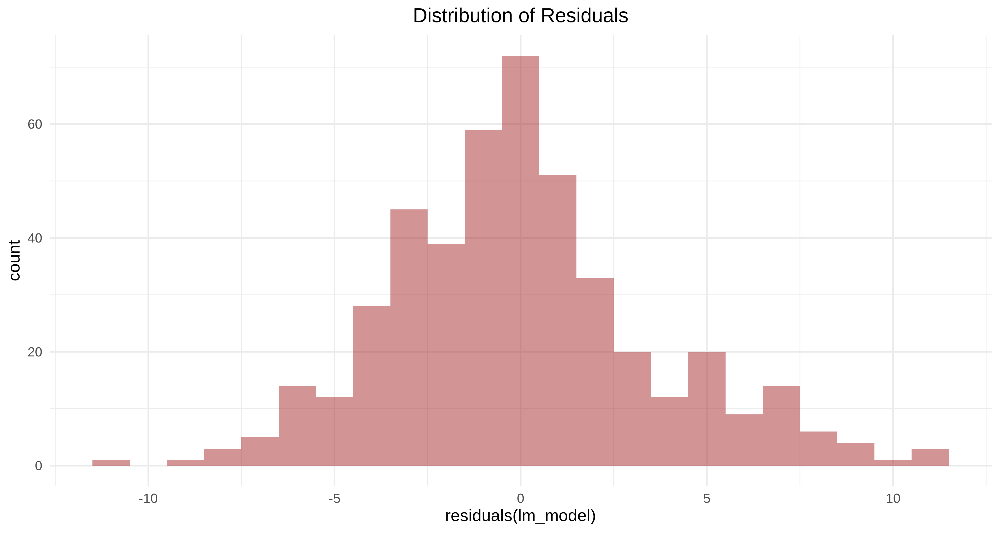

In [29]:
options(repr.plot.res=300, repr.plot.height=8)

res <- as.data.frame(residuals(lm_model))
ggplot(res,aes(residuals(lm_model)))+
geom_histogram(fill='brown',alpha=0.5, binwidth=1) +
theme_minimal( base_size=18) + theme( plot.title = element_text( hjust=0.5)) + labs(title="Distribution of Residuals")

**Inference:**
* The residuals does not follow the exact normal distribution.
* But we take it to be normal within accepted margins.

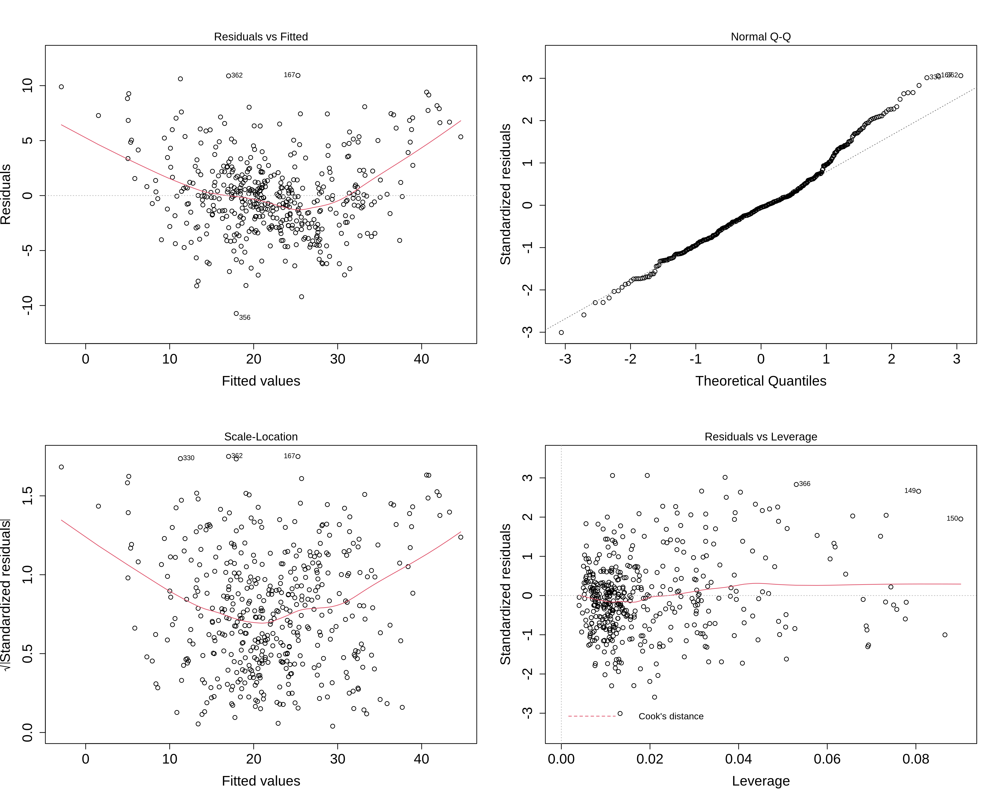

In [30]:
options(repr.plot.height=12,repr.plot.res=300)
par(mfrow = c(2,2))
plot(lm_model, cex.lab=1.5, cex.axis=1.5)

## CV Model

### Partitioning training and test dataset:

In [11]:
suppressMessages(library(caret))
set.seed(998)
trainPartitionRows <- createDataPartition(boston_dataset$MEDV, p = .90, list = FALSE)

cat("Total no of observations = ", nrow(boston_dataset),"\n")
cat("# for training = ", nrow(trainPartitionRows),"\n")
cat("# for testing = ", nrow(boston_dataset) - nrow(trainPartitionRows),"\n")

Total no of observations =  452 
# for training =  409 
# for testing =  43 


In [12]:
trainDataset <- boston_dataset[ trainPartitionRows,]
testDataset  <- boston_dataset[-trainPartitionRows,]

cat("\nHead of TRAIN DATASET:")
head(trainDataset)
cat("\nHead of TEST DATASET:")
head(testDataset)



Head of TRAIN DATASET:

MEDV,ZN,CHAS,NOX,RM,DIS,PTRATIO,B,LSTAT
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
24.0,18.0,0,0.538,6.575,4.0900,15.3,396.90,4.98
21.6,0.0,0,0.469,6.421,4.9671,17.8,396.90,9.14
34.7,0.0,0,0.469,7.185,4.9671,17.8,392.83,4.03
33.4,0.0,0,0.458,6.998,6.0622,18.7,394.63,2.94
22.9,12.5,0,0.524,6.012,5.5605,15.2,395.60,12.43
27.1,12.5,0,0.524,6.172,5.9505,15.2,396.90,19.15



Head of TEST DATASET:

MEDV,ZN,CHAS,NOX,RM,DIS,PTRATIO,B,LSTAT
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
36.2,0,0,0.458,7.147,6.0622,18.7,396.90,5.33
28.7,0,0,0.458,6.430,6.0622,18.7,394.12,5.21
15.2,0,0,0.538,6.142,3.9769,21.0,396.90,18.72
21.0,0,0,0.499,5.850,3.9342,19.2,396.90,8.77
20.0,0,0,0.448,5.786,5.1004,17.9,396.90,14.15
35.4,90,0,0.403,7.249,8.6966,17.9,395.93,4.81


### Performing Cross-Validation:

In [13]:
fitControl <- trainControl(## 10-fold CV
                          method = "cv", # repeatedcv
                          number = 10
                          ## repeated ten times
                          #repeats = 10,
                          )

CVModel <- train(MEDV ~ .,
                    data = trainDataset,
                    method = "lm",
                    trControl = fitControl,
                    ## This last option is actually one
                    ## for gbm() that passes through
                    #verbose = TRUE
                    )

CVModel
summary(CVModel)

Linear Regression 

409 samples
  8 predictor

No pre-processing
Resampling: Cross-Validated (10 fold) 
Summary of sample sizes: 369, 367, 368, 368, 368, 368, ... 
Resampling results:

  RMSE      Rsquared   MAE     
  3.559482  0.8238594  2.697849

Tuning parameter 'intercept' was held constant at a value of TRUE


Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
     Min       1Q   Median       3Q      Max 
-10.8997  -2.2667  -0.1929   1.7162  10.9619 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  14.897890   4.528117   3.290  0.00109 ** 
ZN            0.024623   0.010875   2.264  0.02410 *  
CHAS          1.575802   0.965662   1.632  0.10350    
NOX         -12.097020   3.254296  -3.717  0.00023 ***
RM            5.553978   0.406459  13.664  < 2e-16 ***
DIS          -0.914665   0.158550  -5.769 1.60e-08 ***
PTRATIO      -0.979858   0.104012  -9.421  < 2e-16 ***
B             0.014407   0.002423   5.945 6.03e-09 ***
LSTAT        -0.400045   0.044929  -8.904  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.553 on 400 degrees of freedom
Multiple R-squared:  0.8244,	Adjusted R-squared:  0.8209 
F-statistic: 234.8 on 8 and 400 DF,  p-value: < 2.2e-16


**<u>CV Model</u>
<br>RMSE = 3.55
<br>Adjusted R-squared = 0.82
<br>Mean Absolute Error (MAE) = 2.69**

### Validation on training data for CV-Model:

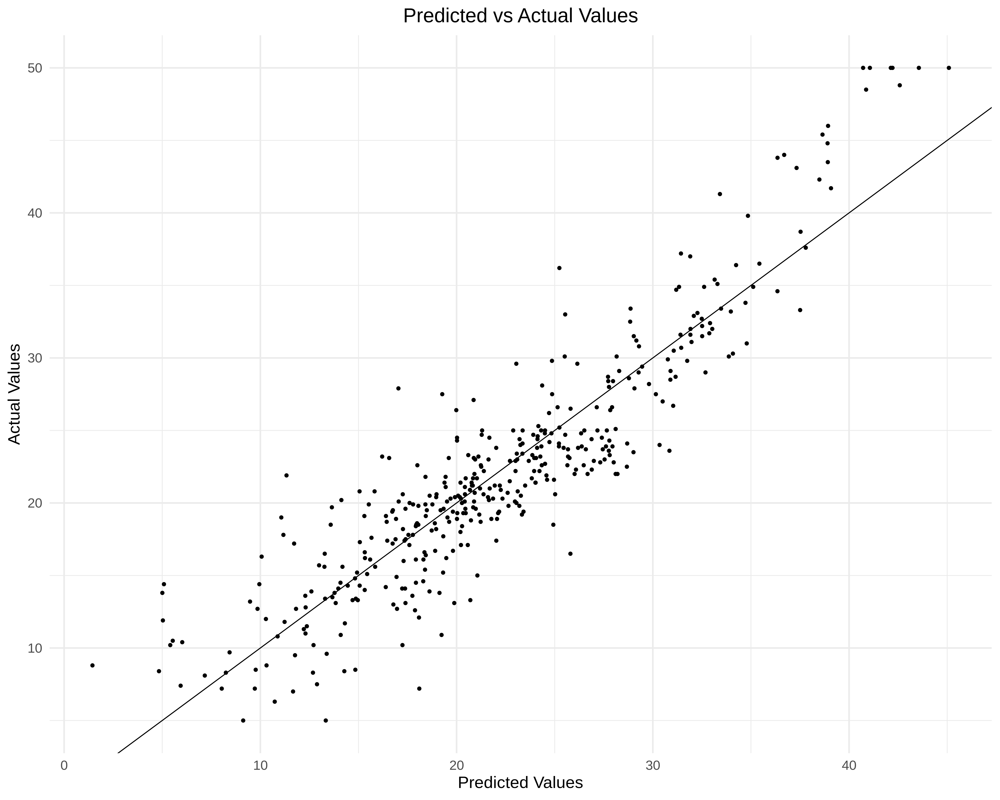

In [31]:
#validation on training data

pred<- predict(CVModel, trainDataset)
validation<- data.frame(actual= trainDataset$MEDV, predicted= pred)
ggplot(validation, aes(x= predicted, y=actual))+
geom_point()+
geom_abline(intercept=0, slope=1)+
theme_minimal(base_size=18) + theme( plot.title = element_text( hjust=0.5)) +
labs(x= 'Predicted Values', y= "Actual Values", title= "Predicted vs Actual Values")

**Inference:**
* Their is the linear relation between observed and predicted values.

### Summary of Prediction:

In [29]:
residuals<- (validation$actual - validation$predicted)^2
RMSE <- sqrt(mean(residuals))
summary(pred)

cat("RMSE on train data:",RMSE)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.444  17.395  21.257  22.204  26.889  45.086 

RMSE on train data: 3.513884

### Validation on Test data:

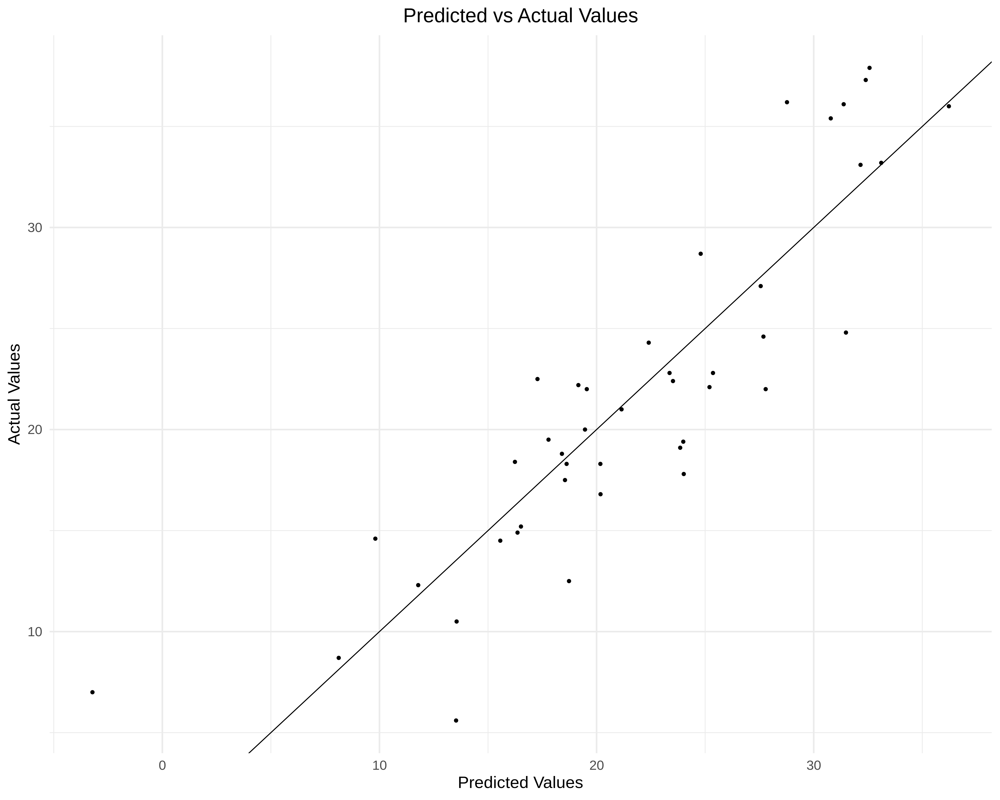

In [35]:
#TESTING

pred1<- predict(CVModel, newdata= testDataset)
test<- data.frame(actual= testDataset$MEDV, predicted= pred1)
ggplot(test, aes(x= predicted, y=actual))+
geom_point()+
geom_abline(intercept=0, slope=1)+
theme_minimal(base_size=18) + theme( plot.title = element_text( hjust=0.5)) +
labs(x= 'Predicted Values', y= "Actual Values", title= "Predicted vs Actual Values")



### Summary of validation on test data:

In [32]:
summary(pred1)
residuals1<- (test$actual - test$predicted)^2
RMSE1 <- sqrt(mean(residuals1))
cat("RMSE on test data:",RMSE1)


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 -3.219  17.532  21.150  21.761  27.622  36.225 

RMSE on test data: 3.946302

**Inference:**  
RMSE on test data: 3.94630  
RMSE on train data: 3.513884
* The difference in RMSE between train and test data is ~0.4

### Training perfomance vs Testing performance

In [163]:
n=nrow(trainDataset)
# create empty data frame 
learnCurve <- data.frame(m=double(n),
                     trainRMSE=double(n),
                     cvRMSE = double(n))

# test data response feature
testY <- testDataset$MEDV

# Run algorithms using 10-fold cross validation with 3 repeats
trainControl <- trainControl(method="repeatedcv", number=10, repeats=3)
metric <- "RMSE"

# loop over training examples
for (i in 137:nrow(trainDataset)) {
    learnCurve$m[i] <- i
    
    # train learning algorithm with size i
    fit.lm <- train(MEDV~., 
                    data=trainDataset[1:i,], 
                    method="lm", 
                    metric="RMSE",
                    #preProc=c("center", "scale"), 
                    trControl=trainControl)    
    
    learnCurve$trainRMSE[i] <- fit.lm$results$RMSE
    
    # use trained parameters to predict on test data
    prediction <- predict(fit.lm, newdata = testDataset[,-1])
    rmse <- postResample(prediction, testY)
    learnCurve$cvRMSE[i] <- rmse[1]
}


Warning message in predict.lm(modelFit, newdata):
“prediction from a rank-deficient fit may be misleading”


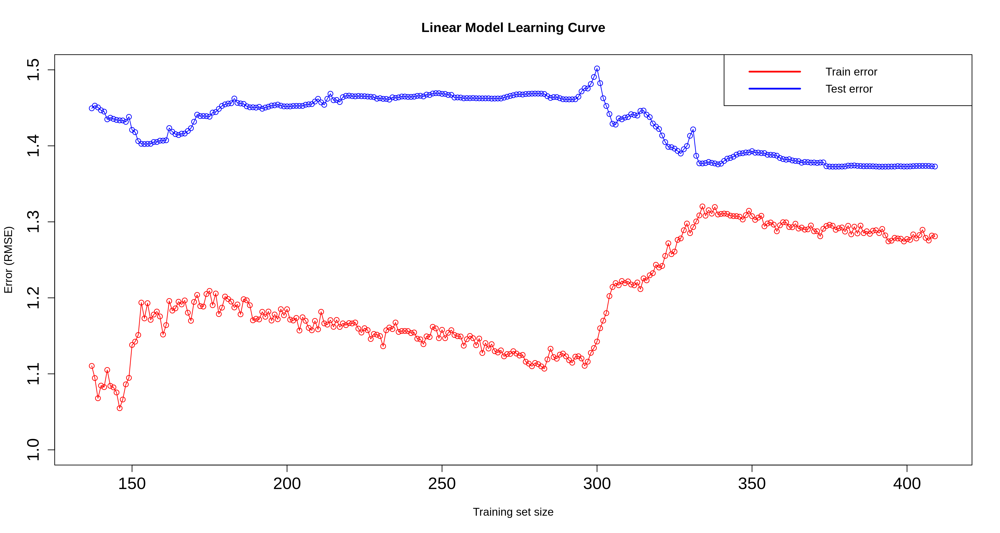

In [164]:
plot(log(learnCurve$trainRMSE),type = "o",col = "red",xlab = "Training set size",
           ylab = "Error (RMSE)", main = "Linear Model Learning Curve", ylim=c(1,1.50), xlim=c(136,410), cex.axis=1.5, cex.lab=1.5)
lines(log(learnCurve$cvRMSE), type = "o", col = "blue")

legend('topright', c("Train error", "Test error"), lty = c(1,1), lwd = c(2.5, 2.5),
      col = c("red", "blue"))

## Saving Model

Since the best performing model is CV model thus we take same as the CV model.

In [13]:
final_model <- CVModel
saveRDS(final_model, "./model.rds")

In [204]:
summary(final_model)


Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
     Min       1Q   Median       3Q      Max 
-10.8997  -2.2667  -0.1929   1.7162  10.9619 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  14.897890   4.528117   3.290  0.00109 ** 
ZN            0.024623   0.010875   2.264  0.02410 *  
CHAS          1.575802   0.965662   1.632  0.10350    
NOX         -12.097020   3.254296  -3.717  0.00023 ***
RM            5.553978   0.406459  13.664  < 2e-16 ***
DIS          -0.914665   0.158550  -5.769 1.60e-08 ***
PTRATIO      -0.979858   0.104012  -9.421  < 2e-16 ***
B             0.014407   0.002423   5.945 6.03e-09 ***
LSTAT        -0.400045   0.044929  -8.904  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.553 on 400 degrees of freedom
Multiple R-squared:  0.8244,	Adjusted R-squared:  0.8209 
F-statistic: 234.8 on 8 and 400 DF,  p-value: < 2.2e-16


**<u>Final Model(CV Model)</u>  
RMSE = 3.55  
Adjusted R-squared = 0.82  
Mean Absolute Error (MAE) = 2.69**